In [4]:
import pandas as pd
import requests
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import geopandas
import contextily as cx

In [5]:
car_travel_time_lookup = pd.read_csv("travel_matrix_minutes.zip")

In [6]:
car_travel_time_lookup

,LSOA,B15 2TH,B18 7QH,B4 6NH,B71 4HJ,B75 7RR,B9 5SS,B98 7UB,BA1 3NG,BA21 4AT,...,WD18 0HB,WF1 4DG,WF13 4HS,WF8 1PL,WN1 2NN,WR5 1DD,WS2 9PS,WV10 0QP,YO12 6QL,YO31 8HE
0,Welwyn Hatfield 010F,129.000000,122.066667,116.883333,126.999999,118.750000,118.466667,126.383334,138.383333,162.483333,...,26.583333,183.183333,194.300001,170.716667,210.783334,140.350000,128.933333,135.483333,246.900000,204.383333
1,Welwyn Hatfield 012A,129.716667,122.783334,117.633334,127.716667,119.466667,119.183334,127.100000,139.100000,163.199999,...,27.300000,186.233334,197.350000,173.583333,211.500000,141.066667,129.650000,136.199999,252.500000,207.433333
2,Welwyn Hatfield 002F,130.466667,123.533333,118.350000,128.466667,120.000000,119.933333,127.850000,139.833333,164.933333,...,28.050000,184.316666,195.450000,171.850000,212.250000,141.816666,130.400001,136.950000,248.049999,205.516666
3,Welwyn Hatfield 002E,130.316666,123.399999,118.200000,128.316666,120.066667,119.799999,127.700001,139.700000,163.800000,...,27.900000,184.500000,195.616666,171.850000,212.100000,141.666667,130.250000,136.800000,250.766667,205.700000
4,Welwyn Hatfield 010A,129.033333,122.100000,116.883333,127.033334,118.783333,118.500000,126.416667,138.400000,162.516666,...,26.616666,183.216666,194.333334,170.566667,210.816667,140.383333,128.966666,135.516666,246.933333,204.399999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32838,Selby 009C,142.783334,135.750000,129.816667,139.616667,123.300000,132.150000,147.366667,236.200000,292.850001,...,196.383334,29.600001,39.966667,18.133334,92.666667,161.333333,136.083334,138.699999,85.216667,38.833334
32839,Selby 007D,146.150001,139.116666,134.016667,142.983333,126.650000,135.516666,150.733333,239.550001,296.216667,...,199.733334,32.966667,44.166666,22.316666,96.849999,164.700000,139.450000,142.066666,85.433334,38.550000
32840,Selby 007B,143.766667,136.750000,132.616666,140.600000,124.283333,133.150000,148.366666,236.500000,293.850000,...,197.366666,32.816667,43.933333,21.683333,96.633333,162.333333,137.066666,139.683334,81.683333,34.866667
32841,Selby 006A,145.583333,138.550000,133.366667,142.416667,126.099999,134.950000,150.166666,239.000000,295.650000,...,199.166666,34.616667,45.733333,23.483333,98.433333,164.133333,138.883333,141.500000,83.566666,36.766666


In [7]:
car_travel_time_lookup.columns

Index(['LSOA', 'B15 2TH', 'B18 7QH', 'B4 6NH', 'B71 4HJ', 'B75 7RR', 'B9 5SS',
       'B98 7UB', 'BA1 3NG', 'BA21 4AT',
       ...
       'WD18 0HB', 'WF1 4DG', 'WF13 4HS', 'WF8 1PL', 'WN1 2NN', 'WR5 1DD',
       'WS2 9PS', 'WV10 0QP', 'YO12 6QL', 'YO31 8HE'],
      dtype='object', length=186)

In [8]:
birmingham_area_hospitals_df = pd.DataFrame([
    {'postcode': 'B18 7QH', 'name': 'City Hospital'},
    {'postcode': 'B15 2TH', 'name': 'Queen Elizabeth Hospital Birmingham'}, # Actually B15 2WB
    {'postcode': 'B9 5SS', 'name': 'Heartlands Hospital '},
    {'postcode': 'B71 4HJ', 'name': 'Sandwell District General Hospital'},
    {'postcode': 'B75 7RR', 'name': ' Good Hope Hospital'},
    {'postcode': 'WS2 9PS', 'name': 'Manor Hospital'},
    {'postcode': 'DY1 2HQ', 'name': 'Russells Hall Hospital'},
    {'postcode': 'WV10 0QP', 'name': 'New Cross Hospital'},
    {'postcode': 'B98 7UB', 'name': 'Alexandra Hospital'},
    {'postcode': 'CV10 7DJ', 'name': 'George Eliot Hospital'},
    {'postcode': 'CV34 5BW', 'name': ' Warwick Hospital'},
    {'postcode': 'CV2 2DX', 'name': 'University Hospital (Coventry)'},
    {'postcode': 'WR5 1DD', 'name': 'Worcestershire Royal Hospital'},
    {'postcode': 'ST16 3SA', 'name': 'Stafford Hospital'},
    {'postcode': 'TF1 6TF', 'name': 'Princess Royal Hospital'},
    {'postcode': 'LE1 5WW', 'name': 'Leicester Royal Infirmary'},
    {'postcode': 'DE22 3NE', 'name': 'Royal Derby Hospital'},
    {'postcode': 'OX16 9AL', 'name': 'Horton General Hospital'},
    {'postcode': 'ST4 6QG', 'name': 'Royal Stoke University Hospital'},
    {'postcode': 'SY3 8XQ', 'name': 'Royal Shrewsbury Hospital'}
 ])

birmingham_area_hospitals_df

,postcode,name
0,B18 7QH,City Hospital
1,B15 2TH,Queen Elizabeth Hospital Birmingham
2,B9 5SS,Heartlands Hospital
3,B71 4HJ,Sandwell District General Hospital
4,B75 7RR,Good Hope Hospital
5,WS2 9PS,Manor Hospital
6,DY1 2HQ,Russells Hall Hospital
7,WV10 0QP,New Cross Hospital
8,B98 7UB,Alexandra Hospital
9,CV10 7DJ,George Eliot Hospital


In [9]:
birmingham_area_hospitals_df.head(20)

,postcode,name
0,B18 7QH,City Hospital
1,B15 2TH,Queen Elizabeth Hospital Birmingham
2,B9 5SS,Heartlands Hospital
3,B71 4HJ,Sandwell District General Hospital
4,B75 7RR,Good Hope Hospital
5,WS2 9PS,Manor Hospital
6,DY1 2HQ,Russells Hall Hospital
7,WV10 0QP,New Cross Hospital
8,B98 7UB,Alexandra Hospital
9,CV10 7DJ,George Eliot Hospital


In [10]:
birmingham_area_hospitals_df.postcode.to_list()

['B18 7QH',
 'B15 2TH',
 'B9 5SS',
 'B71 4HJ',
 'B75 7RR',
 'WS2 9PS',
 'DY1 2HQ',
 'WV10 0QP',
 'B98 7UB',
 'CV10 7DJ',
 'CV34 5BW',
 'CV2 2DX',
 'WR5 1DD',
 'ST16 3SA',
 'TF1 6TF',
 'LE1 5WW',
 'DE22 3NE',
 'OX16 9AL',
 'ST4 6QG',
 'SY3 8XQ']

In [11]:
car_travel_time_lookup_birmingham_hospitals = car_travel_time_lookup.loc[
    :,
    ['LSOA'] + birmingham_area_hospitals_df.postcode.to_list()
    ]

In [12]:
car_travel_time_lookup_birmingham_hospitals

,LSOA,B18 7QH,B15 2TH,B9 5SS,B71 4HJ,B75 7RR,WS2 9PS,DY1 2HQ,WV10 0QP,B98 7UB,...,CV34 5BW,CV2 2DX,WR5 1DD,ST16 3SA,TF1 6TF,LE1 5WW,DE22 3NE,OX16 9AL,ST4 6QG,SY3 8XQ
0,Welwyn Hatfield 010F,122.066667,129.000000,118.466667,126.999999,118.750000,128.933333,139.766666,135.483333,126.383334,...,103.633334,94.816666,140.350000,148.466667,155.000000,104.250000,131.566667,90.516666,158.966667,168.683334
1,Welwyn Hatfield 012A,122.783334,129.716667,119.183334,127.716667,119.466667,129.650000,140.483333,136.199999,127.100000,...,104.350000,95.533334,141.066667,149.183333,155.716667,104.966667,132.283333,91.233333,159.683334,169.400000
2,Welwyn Hatfield 002F,123.533333,130.466667,119.933333,128.466667,120.000000,130.400001,141.233334,136.950000,127.850000,...,105.100000,96.283333,141.816666,149.933333,156.466666,105.716667,133.033333,91.983334,160.433333,170.150000
3,Welwyn Hatfield 002E,123.399999,130.316666,119.799999,128.316666,120.066667,130.250000,141.083333,136.800000,127.700001,...,104.966667,96.133333,141.666667,149.800000,156.316667,105.583333,132.883334,91.850000,160.299999,170.000001
4,Welwyn Hatfield 010A,122.100000,129.033333,118.500000,127.033334,118.783333,128.966666,139.800000,135.516666,126.416667,...,103.666667,94.850001,140.383333,148.500000,155.033333,104.283333,131.583334,90.549999,159.000000,168.716667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32838,Selby 009C,135.750000,142.783334,132.150000,139.616667,123.300000,136.083334,153.450000,138.699999,147.366667,...,141.650001,126.950000,161.333333,130.333333,153.966666,116.366666,90.166667,166.383333,130.416667,165.850000
32839,Selby 007D,139.116666,146.150001,135.516666,142.983333,126.650000,139.450000,156.816667,142.066666,150.733333,...,145.016667,130.300000,164.700000,134.516667,157.316666,119.733333,93.533334,169.733333,133.783334,170.050000
32840,Selby 007B,136.750000,143.766667,133.150000,140.600000,124.283333,137.066666,154.433333,139.683334,148.366666,...,142.650000,127.933334,162.333333,132.083333,154.950000,117.350001,91.150000,167.366667,133.633333,168.550000
32841,Selby 006A,138.550000,145.583333,134.950000,142.416667,126.099999,138.883333,156.249999,141.500000,150.166666,...,144.450000,129.750000,164.133333,133.883333,156.750000,119.166667,92.966666,169.183333,135.433333,170.350000


In [13]:
car_travel_time_lookup_birmingham_hospitals = car_travel_time_lookup_birmingham_hospitals.set_index('LSOA')

In [14]:
car_travel_time_lookup_birmingham_hospitals

,B18 7QH,B15 2TH,B9 5SS,B71 4HJ,B75 7RR,WS2 9PS,DY1 2HQ,WV10 0QP,B98 7UB,CV10 7DJ,CV34 5BW,CV2 2DX,WR5 1DD,ST16 3SA,TF1 6TF,LE1 5WW,DE22 3NE,OX16 9AL,ST4 6QG,SY3 8XQ
LSOA,,,,,,,,,,,,,,,,,,,,
Welwyn Hatfield 010F,122.066667,129.000000,118.466667,126.999999,118.750000,128.933333,139.766666,135.483333,126.383334,101.483333,103.633334,94.816666,140.350000,148.466667,155.000000,104.250000,131.566667,90.516666,158.966667,168.683334
Welwyn Hatfield 012A,122.783334,129.716667,119.183334,127.716667,119.466667,129.650000,140.483333,136.199999,127.100000,102.200000,104.350000,95.533334,141.066667,149.183333,155.716667,104.966667,132.283333,91.233333,159.683334,169.400000
Welwyn Hatfield 002F,123.533333,130.466667,119.933333,128.466667,120.000000,130.400001,141.233334,136.950000,127.850000,102.950001,105.100000,96.283333,141.816666,149.933333,156.466666,105.716667,133.033333,91.983334,160.433333,170.150000
Welwyn Hatfield 002E,123.399999,130.316666,119.799999,128.316666,120.066667,130.250000,141.083333,136.800000,127.700001,102.800000,104.966667,96.133333,141.666667,149.800000,156.316667,105.583333,132.883334,91.850000,160.299999,170.000001
Welwyn Hatfield 010A,122.100000,129.033333,118.500000,127.033334,118.783333,128.966666,139.800000,135.516666,126.416667,101.516666,103.666667,94.850001,140.383333,148.500000,155.033333,104.283333,131.583334,90.549999,159.000000,168.716667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Selby 009C,135.750000,142.783334,132.150000,139.616667,123.300000,136.083334,153.450000,138.699999,147.366667,130.300000,141.650001,126.950000,161.333333,130.333333,153.966666,116.366666,90.166667,166.383333,130.416667,165.850000
Selby 007D,139.116666,146.150001,135.516666,142.983333,126.650000,139.450000,156.816667,142.066666,150.733333,133.666667,145.016667,130.300000,164.700000,134.516667,157.316666,119.733333,93.533334,169.733333,133.783334,170.050000
Selby 007B,136.750000,143.766667,133.150000,140.600000,124.283333,137.066666,154.433333,139.683334,148.366666,131.300001,142.650000,127.933334,162.333333,132.083333,154.950000,117.350001,91.150000,167.366667,133.633333,168.550000


In [15]:
car_travel_time_lookup_birmingham_hospitals['shortest'] = car_travel_time_lookup_birmingham_hospitals.min(axis=1)

In [16]:
car_travel_time_lookup_birmingham_hospitals

,B18 7QH,B15 2TH,B9 5SS,B71 4HJ,B75 7RR,WS2 9PS,DY1 2HQ,WV10 0QP,B98 7UB,CV10 7DJ,...,CV2 2DX,WR5 1DD,ST16 3SA,TF1 6TF,LE1 5WW,DE22 3NE,OX16 9AL,ST4 6QG,SY3 8XQ,shortest
LSOA,,,,,,,,,,,,,,,,,,,,,
Welwyn Hatfield 010F,122.066667,129.000000,118.466667,126.999999,118.750000,128.933333,139.766666,135.483333,126.383334,101.483333,...,94.816666,140.350000,148.466667,155.000000,104.250000,131.566667,90.516666,158.966667,168.683334,90.516666
Welwyn Hatfield 012A,122.783334,129.716667,119.183334,127.716667,119.466667,129.650000,140.483333,136.199999,127.100000,102.200000,...,95.533334,141.066667,149.183333,155.716667,104.966667,132.283333,91.233333,159.683334,169.400000,91.233333
Welwyn Hatfield 002F,123.533333,130.466667,119.933333,128.466667,120.000000,130.400001,141.233334,136.950000,127.850000,102.950001,...,96.283333,141.816666,149.933333,156.466666,105.716667,133.033333,91.983334,160.433333,170.150000,91.983334
Welwyn Hatfield 002E,123.399999,130.316666,119.799999,128.316666,120.066667,130.250000,141.083333,136.800000,127.700001,102.800000,...,96.133333,141.666667,149.800000,156.316667,105.583333,132.883334,91.850000,160.299999,170.000001,91.850000
Welwyn Hatfield 010A,122.100000,129.033333,118.500000,127.033334,118.783333,128.966666,139.800000,135.516666,126.416667,101.516666,...,94.850001,140.383333,148.500000,155.033333,104.283333,131.583334,90.549999,159.000000,168.716667,90.549999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Selby 009C,135.750000,142.783334,132.150000,139.616667,123.300000,136.083334,153.450000,138.699999,147.366667,130.300000,...,126.950000,161.333333,130.333333,153.966666,116.366666,90.166667,166.383333,130.416667,165.850000,90.166667
Selby 007D,139.116666,146.150001,135.516666,142.983333,126.650000,139.450000,156.816667,142.066666,150.733333,133.666667,...,130.300000,164.700000,134.516667,157.316666,119.733333,93.533334,169.733333,133.783334,170.050000,93.533334
Selby 007B,136.750000,143.766667,133.150000,140.600000,124.283333,137.066666,154.433333,139.683334,148.366666,131.300001,...,127.933334,162.333333,132.083333,154.950000,117.350001,91.150000,167.366667,133.633333,168.550000,91.150000


In [17]:
lsoa_geojson_path = 'LSOA_2011_Boundaries_Super_Generalised_Clipped_BSC_EW_V4.geojson'

lsoa_boundaries = geopandas.read_file(lsoa_geojson_path)

In [18]:
lsoa_boundaries

,FID,LSOA11CD,LSOA11NM,LSOA11NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
0,1,E01000001,City of London 001A,City of London 001A,532123,181632,-0.097140,51.51816,a758442e-7679-45d0-95a8-ed4c968ecdaa,"POLYGON ((532282.629 181906.496, 532248.250 18..."
1,2,E01000002,City of London 001B,City of London 001B,532480,181715,-0.091970,51.51882,861dbb53-dfaf-4f57-be96-4527e2ec511f,"POLYGON ((532746.814 181786.892, 532248.250 18..."
2,3,E01000003,City of London 001C,City of London 001C,532239,182033,-0.095320,51.52174,9f765b55-2061-484a-862b-fa0325991616,"POLYGON ((532293.068 182068.422, 532419.592 18..."
3,4,E01000005,City of London 001E,City of London 001E,533581,181283,-0.076270,51.51468,a55c4c31-ef1c-42fc-bfa9-07c8f2025928,"POLYGON ((533604.245 181418.129, 533743.689 18..."
4,5,E01000006,Barking and Dagenham 016A,Barking and Dagenham 016A,544994,184274,0.089317,51.53875,9cdabaa8-d9bd-4a94-bb3b-98a933ceedad,"POLYGON ((545271.918 184183.948, 545296.314 18..."
...,...,...,...,...,...,...,...,...,...,...
34748,34749,W01001954,Cardiff 006F,Caerdydd 006F,312959,180574,-3.255820,51.51735,5fc2d16e-8663-462f-936d-7535d0de1732,"POLYGON ((313011.929 181083.889, 313533.809 18..."
34749,34750,W01001955,Swansea 025F,Abertawe 025F,265633,193182,-3.942370,51.62137,0bcc9472-48d1-460c-a40e-c4a745269d84,"POLYGON ((266079.095 193572.406, 266140.774 19..."
34750,34751,W01001956,Swansea 023E,Abertawe 023E,260586,192621,-4.015000,51.61510,557e08ba-6aee-491d-8ba1-79eca916ce6b,"POLYGON ((260107.578 194891.580, 260436.897 19..."
34751,34752,W01001957,Swansea 025G,Abertawe 025G,265337,192555,-3.946400,51.61567,43f945c4-e97d-4b1f-9e4d-46d154a6662e,"POLYGON ((264991.859 192395.891, 264913.891 19..."


<Axes: >

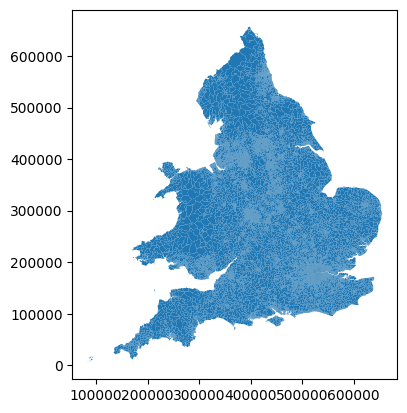

In [19]:
lsoa_boundaries.plot()

In [20]:
nearest_hospital_travel_bham_gdf = pd.merge(
    lsoa_boundaries,
    car_travel_time_lookup_birmingham_hospitals.reset_index(),
    left_on="LSOA11NM",
    right_on="LSOA",
    how="right"
)

<Axes: >

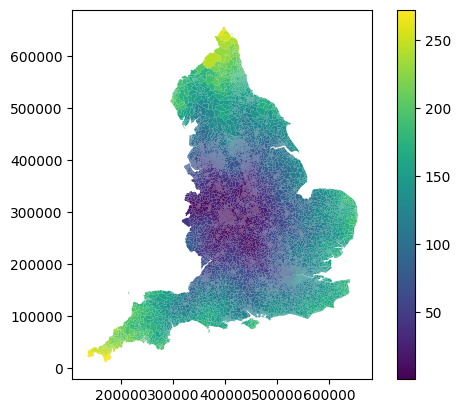

In [21]:
nearest_hospital_travel_bham_gdf.plot(
    column='shortest',
    legend=True
    )

In [22]:
postcode_lookup = requests.post(
        "https://api.postcodes.io/postcodes",
        json={"postcodes": birmingham_area_hospitals_df['postcode'].tolist()}
    )

postcode_lookup = pd.json_normalize(postcode_lookup.json()['result'], sep='_')

birmingham_area_hospitals_df = pd.merge(
    birmingham_area_hospitals_df,
    postcode_lookup,
    left_on="postcode",
    right_on="query"
)

In [23]:
birmingham_area_hospitals_df

,postcode,name,query,result_postcode,result_quality,result_eastings,result_northings,result_country,result_nhs_ha,result_longitude,...,result_codes_parliamentary_constituency,result_codes_parliamentary_constituency_2024,result_codes_ccg,result_codes_ccg_id,result_codes_ced,result_codes_nuts,result_codes_lsoa,result_codes_msoa,result_codes_lau2,result_codes_pfa
0,B18 7QH,City Hospital,B18 7QH,B18 7QH,1,404680,287859,England,West Midlands,-1.932507,...,E14000564,E14001096,E38000258,15E,E99999999,TLG31,E01009345,E02001879,E08000025,E23000014
1,B15 2TH,Queen Elizabeth Hospital Birmingham,B15 2TH,B15 2TH,1,404278,283916,England,West Midlands,-1.938476,...,E14000560,E14001092,E38000258,15E,E99999999,TLG31,E01033562,E02001913,E08000025,E23000014
2,B9 5SS,Heartlands Hospital,B9 5SS,B9 5SS,1,411645,286935,England,West Midlands,-1.829966,...,E14000563,E14001095,E38000258,15E,E99999999,TLG31,E01009341,E02001892,E08000025,E23000014
3,B71 4HJ,Sandwell District General Hospital,B71 4HJ,B71 4HJ,1,400852,292245,England,West Midlands,-1.988866,...,E14001029,E14001574,E38000259,D2P2L,E99999999,TLG37,E01010104,E02002059,E08000028,E23000014
4,B75 7RR,Good Hope Hospital,B75 7RR,B75 7RR,1,412837,296632,England,West Midlands,-1.812043,...,E14000985,E14001535,E38000258,15E,E99999999,TLG31,E01009432,E02001832,E08000025,E23000014
5,WS2 9PS,Manor Hospital,WS2 9PS,WS2 9PS,1,400170,298280,England,West Midlands,-1.998924,...,E14001012,E14001562,E38000259,D2P2L,E99999999,TLG38,E01010363,E02002135,E08000030,E23000014
6,DY1 2HQ,Russells Hall Hospital,DY1 2HQ,DY1 2HQ,1,392108,289339,England,West Midlands,-2.117684,...,E14000671,E14001204,E38000259,D2P2L,E99999999,TLG36,E01009884,E02002012,E08000027,E23000014
7,WV10 0QP,New Cross Hospital,WV10 0QP,WV10 0QP,1,393625,300219,England,West Midlands,-2.095555,...,E14001049,E14001594,E38000259,D2P2L,E99999999,TLG39,E01010476,E02002163,E08000031,E23000014
8,B98 7UB,Alexandra Hospital,B98 7UB,B98 7UB,1,406092,264629,England,West Midlands,-1.912127,...,E14000892,E14001441,E38000236,18C,E58001671,TLG12,E01032253,E02006729,E07000236,E23000016
9,CV10 7DJ,George Eliot Hospital,CV10 7DJ,CV10 7DJ,1,435493,290649,England,West Midlands,-1.478439,...,E14000868,E14001413,E38000251,B2M3M,E58001544,TLG13,E01031049,E02006482,E07000219,E23000017


In [24]:
birmingham_area_hospitals_gdf = geopandas.GeoDataFrame(
    birmingham_area_hospitals_df,
    geometry = geopandas.points_from_xy(
        birmingham_area_hospitals_df['result_eastings'],
        birmingham_area_hospitals_df['result_northings']
        ),
    crs = 'EPSG:27700'
    )

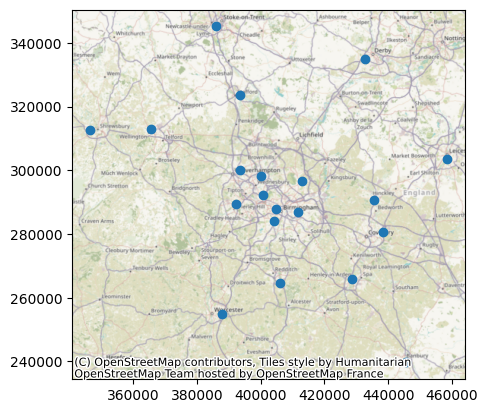

In [25]:
ax = birmingham_area_hospitals_gdf.plot()

cx.add_basemap(
    ax,
    crs=birmingham_area_hospitals_gdf.crs.to_string(),
    zoom=9
    )

(250000.0, 310000.0)

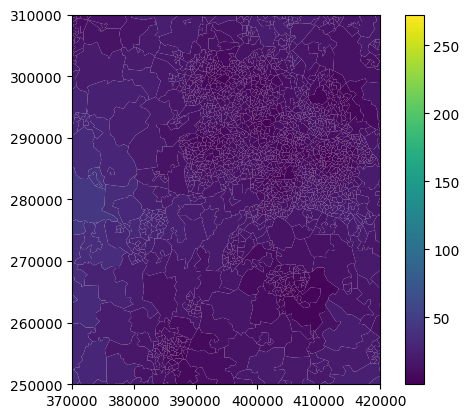

In [26]:
xmin, xmax = 370000, 420000
ymin, ymax = 250000, 310000

ax = nearest_hospital_travel_bham_gdf.plot(
    column='shortest',
    legend=True
    )

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

(250000.0, 310000.0)

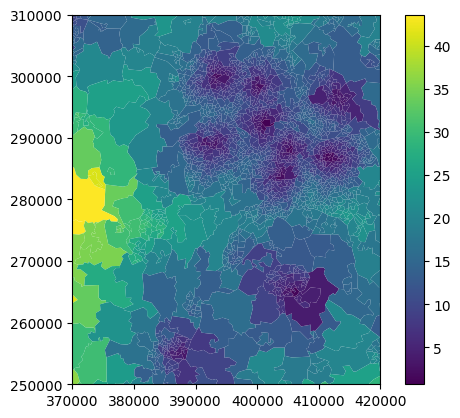

In [27]:
xmin, xmax = 370000, 420000
ymin, ymax = 250000, 310000

nearest_hospital_travel_bham_gdf_filter = nearest_hospital_travel_bham_gdf.cx[xmin:xmax, ymin:ymax]


ax = nearest_hospital_travel_bham_gdf_filter.plot(
    column='shortest',
    legend=True
    )

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

(250000.0, 310000.0)

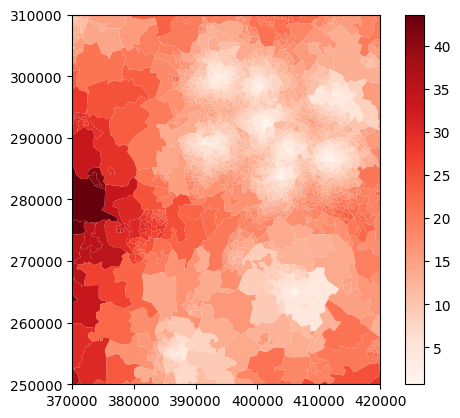

In [28]:
xmin, xmax = 370000, 420000
ymin, ymax = 250000, 310000

nearest_hospital_travel_bham_gdf_filter = nearest_hospital_travel_bham_gdf.cx[xmin:xmax, ymin:ymax]

ax = nearest_hospital_travel_bham_gdf_filter.plot(
    column='shortest',
    cmap="Reds",
    legend=True
    )

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

<Axes: >

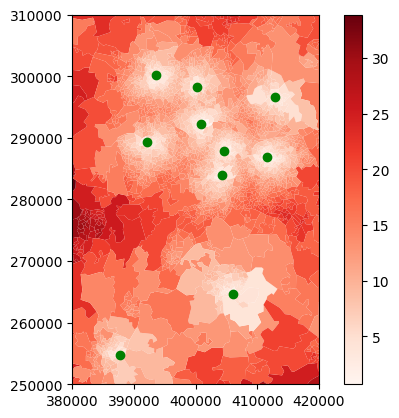

In [29]:
xmin, xmax = 380000, 420000
ymin, ymax = 250000, 310000

nearest_hospital_travel_bham_gdf_filter = nearest_hospital_travel_bham_gdf.cx[xmin:xmax, ymin:ymax]


ax = nearest_hospital_travel_bham_gdf_filter.plot(
    column='shortest',
    cmap="Reds",
    legend=True
    )

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

birmingham_area_hospitals_gdf.plot(ax=ax, color='green')


(240000.0, 320000.0)

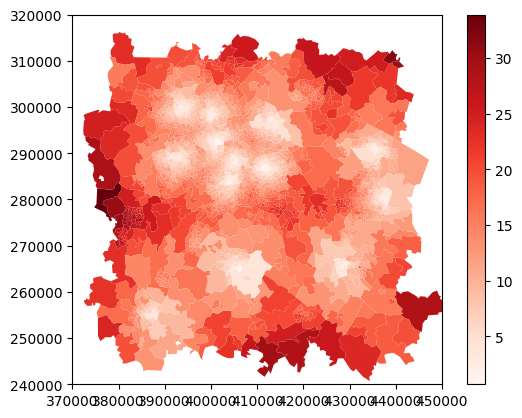

In [30]:
xmin, xmax = 380000, 440000
ymin, ymax = 250000, 310000

nearest_hospital_travel_bham_gdf_filter = nearest_hospital_travel_bham_gdf.cx[xmin:xmax, ymin:ymax]

ax = nearest_hospital_travel_bham_gdf_filter.plot(
    column='shortest',
    cmap="Reds",
    legend=True
    )

ax.set_xlim(xmin-10000, xmax+10000)
ax.set_ylim(ymin-10000, ymax+10000)

<Axes: >

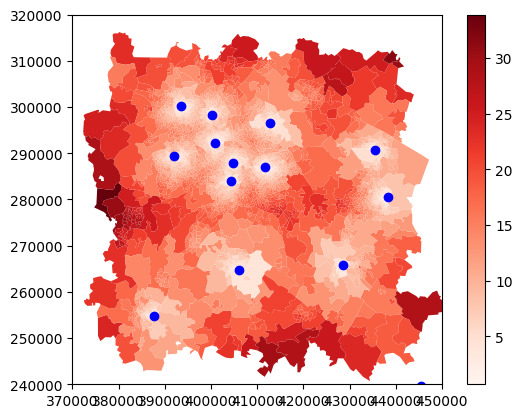

In [31]:
xmin, xmax = 380000, 440000
ymin, ymax = 250000, 310000

nearest_hospital_travel_bham_gdf_filter = nearest_hospital_travel_bham_gdf.cx[xmin:xmax, ymin:ymax]


ax = nearest_hospital_travel_bham_gdf_filter.plot(
    column='shortest',
    cmap="Reds",
    legend=True
    )

ax.set_xlim(xmin-10000, xmax+10000)
ax.set_ylim(ymin-10000, ymax+10000)

birmingham_area_hospitals_gdf.plot(ax=ax, color='blue')


(360000.0, 460000.0, 230000.0, 330000.0)

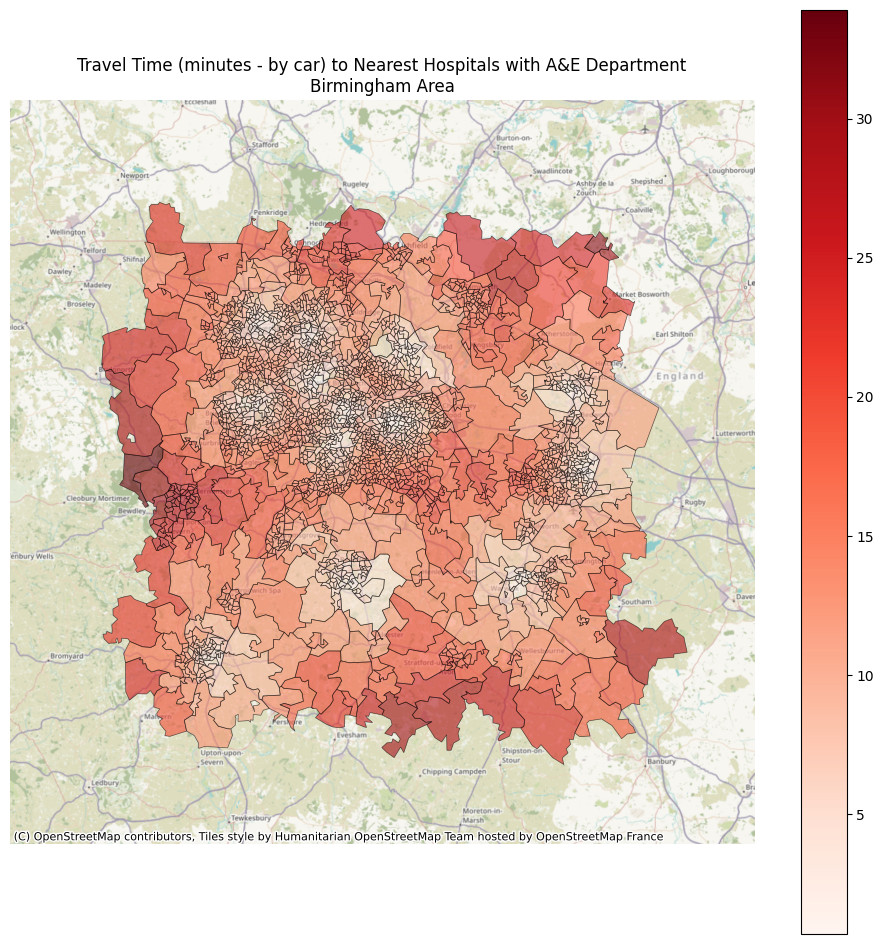

In [32]:
xmin, xmax = 380000, 440000
ymin, ymax = 250000, 310000

nearest_hospital_travel_bham_gdf_filter = nearest_hospital_travel_bham_gdf.cx[xmin:xmax, ymin:ymax]

ax = nearest_hospital_travel_bham_gdf_filter.plot(
    column='shortest',
    cmap="Reds",
    legend=True,
    edgecolor="black",
    linewidth=0.5,
    alpha=0.6,
    figsize=(12,12)
    )

ax.set_xlim(xmin-20000, xmax+20000)
ax.set_ylim(ymin-20000, ymax+20000)

cx.add_basemap(
    ax,
    crs=nearest_hospital_travel_bham_gdf.crs.to_string(),
    zoom=10
    )

plt.title("Travel Time (minutes - by car) to Nearest Hospitals with A&E Department\nBirmingham Area")
ax.axis('off')


(360000.0, 460000.0, 230000.0, 330000.0)

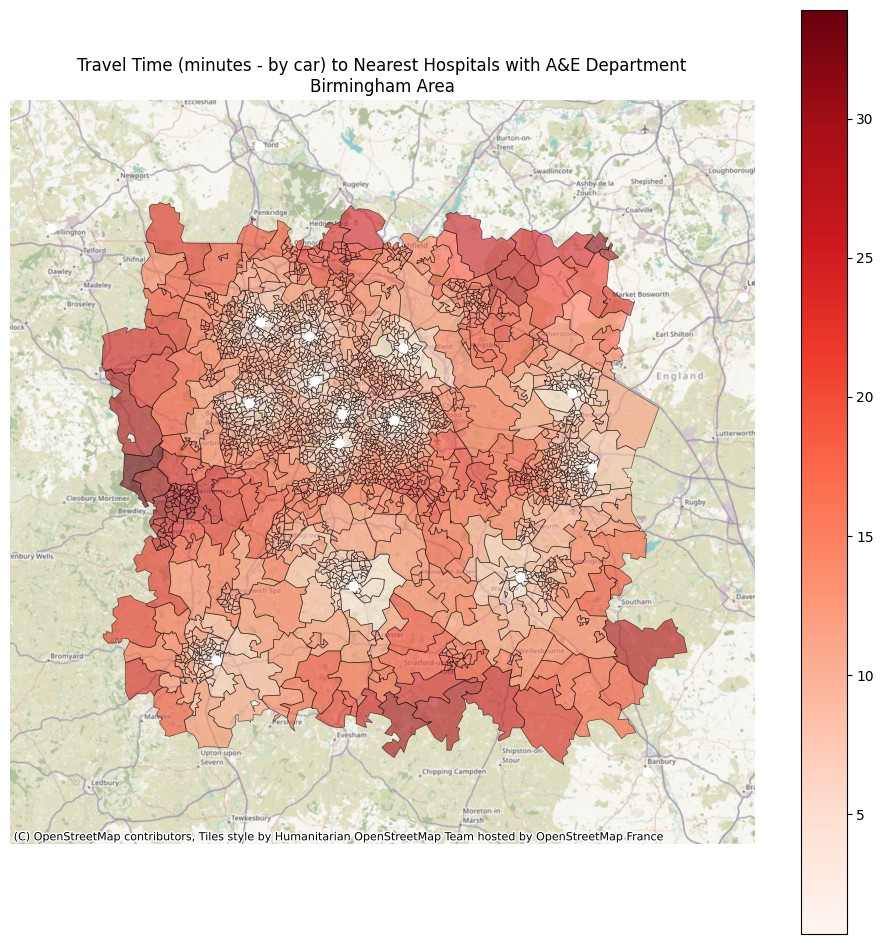

In [33]:
xmin, xmax = 380000, 440000
ymin, ymax = 250000, 310000

nearest_hospital_travel_bham_gdf_filter = nearest_hospital_travel_bham_gdf.cx[xmin:xmax, ymin:ymax]

ax = nearest_hospital_travel_bham_gdf_filter.plot(
    column='shortest',
    cmap="Reds",
    legend=True,
    edgecolor="black",
    linewidth=0.5,
    alpha=0.6,
    figsize=(12,12)
    )

ax.set_xlim(xmin-20000, xmax+20000)
ax.set_ylim(ymin-20000, ymax+20000)

hospital_points = birmingham_area_hospitals_gdf.plot(
    ax=ax,
    color='white',
    markersize=40
    )

cx.add_basemap(
    ax,
    crs=nearest_hospital_travel_bham_gdf.crs.to_string(),
    zoom=10
    )

plt.title("Travel Time (minutes - by car) to Nearest Hospitals with A&E Department\nBirmingham Area")
ax.axis('off')


In [37]:
# imd dataset
# https://assets.publishing.service.gov.uk/government/uploads/system/uploads/attachment_data/file/467764/File_1_ID_2015_Index_of_Multiple_Deprivation.xlsx

imd = pd.read_excel("2015_Index_of_Multiple_Deprivation.xlsx", sheet_name="IMD 2015")

In [38]:
imd.head()

,LSOA code (2011),LSOA name (2011),Local Authority District code (2013),Local Authority District name (2013),Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)
0,E01031349,Adur 001A,E07000223,Adur,21352,7
1,E01031350,Adur 001B,E07000223,Adur,8864,3
2,E01031351,Adur 001C,E07000223,Adur,22143,7
3,E01031352,Adur 001D,E07000223,Adur,17252,6
4,E01031370,Adur 001E,E07000223,Adur,15643,5


In [39]:
imd['imd_rank_reversed'] = 11 - imd['Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)']

In [40]:
imd

,LSOA code (2011),LSOA name (2011),Local Authority District code (2013),Local Authority District name (2013),Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived),Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs),imd_rank_reversed
0,E01031349,Adur 001A,E07000223,Adur,21352,7,4
1,E01031350,Adur 001B,E07000223,Adur,8864,3,8
2,E01031351,Adur 001C,E07000223,Adur,22143,7,4
3,E01031352,Adur 001D,E07000223,Adur,17252,6,5
4,E01031370,Adur 001E,E07000223,Adur,15643,5,6
...,...,...,...,...,...,...,...
32839,E01013341,York 024B,E06000014,York,29241,9,2
32840,E01013342,York 024C,E06000014,York,25821,8,3
32841,E01013423,York 024D,E06000014,York,32637,10,1
32842,E01013424,York 024E,E06000014,York,32799,10,1


In [45]:
#lsoa pop estimates
lsoa_pop = pd.read_excel("mid-2011-lsoa-quinary-estimates.xls", sheet_name="Mid-2011 Persons", skiprows=3)

In [ ]:
lsoa_pop

,Area Codes,Area Names,Unnamed: 2,All Ages,0-4,5-9,10-14,15-19,20-24,25-29,...,45-49,50-54,55-59,60-64,65-69,70-74,75-79,80-84,85-89,90+
0,E06000047,County Durham UA,NaN,512994,28661,25920,27708,32491,35306,30505,...,39550,35882,32918,35372,28299,22920,18018,12803,7389,3585
1,E01020634,NaN,County Durham 001A,1568,90,78,65,83,65,82,...,119,116,97,106,106,94,52,36,24,22
2,E01020635,NaN,County Durham 001B,1377,73,50,52,81,47,77,...,115,126,98,110,94,60,46,33,18,2
3,E01020636,NaN,County Durham 001C,1694,102,74,102,77,88,116,...,123,103,115,93,103,66,72,49,31,15
4,E01020654,NaN,County Durham 001D,1744,109,88,80,84,80,118,...,151,135,92,117,90,71,64,46,24,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35096,W01001636,NaN,Newport 020A,1888,139,161,152,132,72,88,...,184,139,77,73,68,30,31,26,8,4
35097,W01001657,NaN,Newport 020C,1467,93,101,93,108,76,51,...,144,143,96,97,55,55,24,15,12,4
35098,W01001658,NaN,Newport 020D,1883,136,135,130,114,66,73,...,150,148,112,115,81,69,53,49,23,15
35099,W01001912,NaN,Newport 020E,1487,96,77,74,57,57,93,...,95,100,88,143,107,75,60,30,10,4


In [46]:
lsoa_pop = lsoa_pop[lsoa_pop['All Ages'] < 10000]

In [47]:
lsoa_pop = lsoa_pop.rename(columns={'Unnamed: 2': 'LSOA2011NM'})

In [48]:
lsoa_pop_and_imd = pd.merge(
    lsoa_pop[['Area Codes', 'LSOA2011NM', 'All Ages']],
    imd[['LSOA code (2011)', 'imd_rank_reversed']],
    left_on='Area Codes',
    right_on='LSOA code (2011)',
    how='inner'
)

In [49]:
lsoa_pop_and_imd

,Area Codes,LSOA2011NM,All Ages,LSOA code (2011),imd_rank_reversed
0,E01020634,County Durham 001A,1568,E01020634,2
1,E01020635,County Durham 001B,1377,E01020635,2
2,E01020636,County Durham 001C,1694,E01020636,7
3,E01020654,County Durham 001D,1744,E01020654,4
4,E01020676,County Durham 001E,1517,E01020676,5
...,...,...,...,...,...
32839,E01029342,West Somerset 004D,1084,E01029342,6
32840,E01029343,West Somerset 004E,1524,E01029343,7
32841,E01029325,West Somerset 005A,1851,E01029325,6
32842,E01029328,West Somerset 005B,1920,E01029328,7


In [50]:
lsoa_pop_and_imd['demand'] = (lsoa_pop_and_imd['All Ages']*0.2*lsoa_pop_and_imd['imd_rank_reversed']).astype('int')

In [51]:
lsoa_pop_and_imd

,Area Codes,LSOA2011NM,All Ages,LSOA code (2011),imd_rank_reversed,demand
0,E01020634,County Durham 001A,1568,E01020634,2,627
1,E01020635,County Durham 001B,1377,E01020635,2,550
2,E01020636,County Durham 001C,1694,E01020636,7,2371
3,E01020654,County Durham 001D,1744,E01020654,4,1395
4,E01020676,County Durham 001E,1517,E01020676,5,1517
...,...,...,...,...,...,...
32839,E01029342,West Somerset 004D,1084,E01029342,6,1300
32840,E01029343,West Somerset 004E,1524,E01029343,7,2133
32841,E01029325,West Somerset 005A,1851,E01029325,6,2221
32842,E01029328,West Somerset 005B,1920,E01029328,7,2688


In [52]:
lsoa_pop_and_imd.to_csv("lsoa_pop_and_imd.csv")

In [53]:
demand_df = lsoa_pop_and_imd[['LSOA2011NM', 'demand']]

In [54]:
demand_df

,LSOA2011NM,demand
0,County Durham 001A,627
1,County Durham 001B,550
2,County Durham 001C,2371
3,County Durham 001D,1395
4,County Durham 001E,1517
...,...,...
32839,West Somerset 004D,1300
32840,West Somerset 004E,2133
32841,West Somerset 005A,2221
32842,West Somerset 005B,2688


In [55]:
class WeightedAverageObjective:
    '''
    Source: Tom Monks, MIT Licence
    https://github.com/health-data-science-OR/healthcare-logistics/blob/master/optimisation/metapy/evolutionary/evolutionary.py

    Encapsulates logic for calculation of
    weighted average in a simple facility location problem.

    Thanks:
    -------
    Thanks goes to two students - Sammi and Ben in the 2020/21 MSc HDS cohort
    for finding and fixing a bug in the evaluate() method.
    '''

    def __init__(self, demand, travel_matrix):
        '''
        Constructor. store the demand and travel times used
        to calculate the weighted average.

        Parameters:
        ---------
        demand: pd.DataFrame
            demand for by geo sector.
            Assumes there are two columns - one containing a sector reference
            (e.g. LSOA name, MSOA name, Local authority, postcode sector) and
            another containing the demand for that sector.
            There should be one row per sector of interest.
            There must be a common column name between this and the
            travel_matrix object.

        travel_matrix: pd.DataFrame
            Travel cost from geo sector (row) to facility (col).
            Geo sectors must match with those in the demand sector.
            There must be a common column name between this and the
            demand object.
        '''
        self.demand = demand
        self.travel_matrix = travel_matrix

    def create_evaluation_df(self, join_column, demand_column, solution=None):
        '''
        Calculate the weighted average travel time for a solution.
        Assumes patients travel to closest facility.

        Parameters:
        ----------
        solution (optional): np.array
            Representation of a solution
            e.g. [0, 1, 2, 3, 4] will select the first 5 facilities

            If None, will include all facilities when calculating a solution

        join_column: string
            String representation of the column name that is common between
            the demand and travel matrix dataframes.
            Join column name must be the same in the demand and travel matrix
            dataframes (i.e. cannot specify different names for each).

        demand_column: string
            String representation of the column name containing demand in the
            demand matrix.

        Returns:
        --------
            float
        '''

        # only select clinics encoded with 1 in the solution (cast to bool)
        if solution is not None:
            mask = self.travel_matrix.columns[solution]
            active_facilities = self.travel_matrix[mask]
        else:
            active_facilities = self.travel_matrix

        # turn off chained assignment: avoid displaying false +ive
        # SettingWithCopy warning.
        pd.set_option('mode.chained_assignment', None)

        # assume travel to closest facility
        # could also be implemented with .assign
        active_facilities['min_cost'] = \
            active_facilities.set_index(join_column).min(axis=1).to_numpy()

        # turn warnings back on for chained assignment.
        pd.set_option('mode.chained_assignment', 'warn')

        # merge demand and travel times into a single DataFrame
        problem = self.demand.merge(active_facilities, on=join_column,
                                    how='inner')

        # Explore some different ways to weight travel times for visual display
        # We can't match the output of the evaluate_weighted_average method on a
        # per-LSOA scale - but there are other ways we can adjust to give some
        # indication of the importance of each area to the overall result

        # Method 1: Scale the demand column between two values that will act as a multiplier
        # for the minimum travel time.
        # Should the feature range here be a parameter?
        scaler = MinMaxScaler(feature_range=(0.5, 1.5))
        problem['normalised_weights'] = scaler.fit_transform(problem[demand_column].values.reshape(-1, 1))
        problem['adjusted_travel_times'] = problem['min_cost'] * problem['normalised_weights']
        # problem['adjusted_travel_times_v2'] = (problem['min_cost'] *  problem[demand_column]) / sum(problem[demand_column])

        # Method 2: multiply the travel time by the demand
        # rescale them to fit the original bounds of the min travel times per LSOA observed
        scaler_v2 = MinMaxScaler(feature_range=(problem['min_cost'].min(), problem['min_cost'].max()))
        problem['demand_mult_time'] = problem['min_cost'] * problem[demand_column]
        problem['adjusted_travel_times_v2'] = scaler_v2.fit_transform(problem['demand_mult_time'].values.reshape(-1, 1))

        # Method 3: multiply the travel time by the demand
        # rescale them to fit scale of 1 to 10
        # therefore high travel time and high demand will have highest value
        scaler_v3 = MinMaxScaler(feature_range=(1, 10))
        problem['demand_mult_time'] = problem['min_cost'] * problem[demand_column]
        problem['adjusted_travel_times_v3'] = scaler_v3.fit_transform(problem['demand_mult_time'].values.reshape(-1, 1))

        return problem

    def evaluate_weighted_average(self, join_column, demand_column, solution=None):
        '''
        calculate the weighted average travel time for solution

        '''
        problem = self.create_evaluation_df(
            join_column=join_column,
            demand_column=demand_column,
            solution=solution
            )


        # Return weighted average
        return problem, np.average(problem['min_cost'],
                                   weights=problem[demand_column])

    def evaluate_unweighted_average(self, join_column, demand_column, solution=None):
        '''
        calculate the **UN**weighted (simple) average travel time for solution

        '''
        problem = self.create_evaluation_df(
            join_column=join_column,
            demand_column=demand_column,
            solution=solution
            )

        # Return unweighted average
        return problem, np.average(problem['min_cost'])

    def evaluate_max_time(self, join_column, demand_column, solution=None):
        '''
        calculate the maximum travel time of any LSOA for the solution
        '''
        problem = self.create_evaluation_df(
            join_column=join_column,
            demand_column=demand_column,
            solution=solution
            )


        # Return the longest journey time that would be seen
        return problem, np.max(problem['min_cost'])


In [56]:
# load in a demand matrix
demand_df = demand_df.rename(columns={"LSOA2011NM":"LSOA"})
demand_df

,LSOA,demand
0,County Durham 001A,627
1,County Durham 001B,550
2,County Durham 001C,2371
3,County Durham 001D,1395
4,County Durham 001E,1517
...,...,...
32839,West Somerset 004D,1300
32840,West Somerset 004E,2133
32841,West Somerset 005A,2221
32842,West Somerset 005B,2688


In [57]:
demand_df = demand_df[demand_df['LSOA'].isin(nearest_hospital_travel_bham_gdf_filter.LSOA11NM.values)].reset_index(drop=True)

In [58]:
demand_df

,LSOA,demand
0,Hinckley and Bosworth 004C,1215
1,Hinckley and Bosworth 004D,586
2,Hinckley and Bosworth 004E,1304
3,Hinckley and Bosworth 008A,395
4,Hinckley and Bosworth 008B,1791
...,...,...
2425,Wyre Forest 013D,982
2426,Wyre Forest 014A,2401
2427,Wyre Forest 014B,2858
2428,Wyre Forest 014C,1148


In [59]:
travel_time_bham_lkup = car_travel_time_lookup_birmingham_hospitals.reset_index()

In [60]:
travel_time_bham_lkup

,LSOA,B18 7QH,B15 2TH,B9 5SS,B71 4HJ,B75 7RR,WS2 9PS,DY1 2HQ,WV10 0QP,B98 7UB,...,CV2 2DX,WR5 1DD,ST16 3SA,TF1 6TF,LE1 5WW,DE22 3NE,OX16 9AL,ST4 6QG,SY3 8XQ,shortest
0,Welwyn Hatfield 010F,122.066667,129.000000,118.466667,126.999999,118.750000,128.933333,139.766666,135.483333,126.383334,...,94.816666,140.350000,148.466667,155.000000,104.250000,131.566667,90.516666,158.966667,168.683334,90.516666
1,Welwyn Hatfield 012A,122.783334,129.716667,119.183334,127.716667,119.466667,129.650000,140.483333,136.199999,127.100000,...,95.533334,141.066667,149.183333,155.716667,104.966667,132.283333,91.233333,159.683334,169.400000,91.233333
2,Welwyn Hatfield 002F,123.533333,130.466667,119.933333,128.466667,120.000000,130.400001,141.233334,136.950000,127.850000,...,96.283333,141.816666,149.933333,156.466666,105.716667,133.033333,91.983334,160.433333,170.150000,91.983334
3,Welwyn Hatfield 002E,123.399999,130.316666,119.799999,128.316666,120.066667,130.250000,141.083333,136.800000,127.700001,...,96.133333,141.666667,149.800000,156.316667,105.583333,132.883334,91.850000,160.299999,170.000001,91.850000
4,Welwyn Hatfield 010A,122.100000,129.033333,118.500000,127.033334,118.783333,128.966666,139.800000,135.516666,126.416667,...,94.850001,140.383333,148.500000,155.033333,104.283333,131.583334,90.549999,159.000000,168.716667,90.549999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32838,Selby 009C,135.750000,142.783334,132.150000,139.616667,123.300000,136.083334,153.450000,138.699999,147.366667,...,126.950000,161.333333,130.333333,153.966666,116.366666,90.166667,166.383333,130.416667,165.850000,90.166667
32839,Selby 007D,139.116666,146.150001,135.516666,142.983333,126.650000,139.450000,156.816667,142.066666,150.733333,...,130.300000,164.700000,134.516667,157.316666,119.733333,93.533334,169.733333,133.783334,170.050000,93.533334
32840,Selby 007B,136.750000,143.766667,133.150000,140.600000,124.283333,137.066666,154.433333,139.683334,148.366666,...,127.933334,162.333333,132.083333,154.950000,117.350001,91.150000,167.366667,133.633333,168.550000,91.150000
32841,Selby 006A,138.550000,145.583333,134.950000,142.416667,126.099999,138.883333,156.249999,141.500000,150.166666,...,129.750000,164.133333,133.883333,156.750000,119.166667,92.966666,169.183333,135.433333,170.350000,92.966666


In [61]:
wao = WeightedAverageObjective(demand=demand_df, travel_matrix=travel_time_bham_lkup)

In [62]:
wao.evaluate_weighted_average(join_column='LSOA', demand_column='demand', solution=None)[1]

11.14300564986151

In [63]:
wao.evaluate_unweighted_average(join_column='LSOA', demand_column='demand', solution=None)[1]

12.103806588444444

In [64]:
wao.evaluate_max_time(join_column='LSOA', demand_column='demand', solution=None)[1]

33.90000048

In [65]:
wao_df = wao.create_evaluation_df(join_column='LSOA', demand_column='demand', solution=None)

In [66]:
wao_df

,LSOA,demand,B18 7QH,B15 2TH,B9 5SS,B71 4HJ,B75 7RR,WS2 9PS,DY1 2HQ,WV10 0QP,...,OX16 9AL,ST4 6QG,SY3 8XQ,shortest,min_cost,normalised_weights,adjusted_travel_times,demand_mult_time,adjusted_travel_times_v2,adjusted_travel_times_v3
0,Hinckley and Bosworth 004C,1215,44.800000,51.733333,41.200000,49.733333,36.683333,51.650001,62.500000,56.416667,...,73.400000,75.000000,85.366666,22.000000,22.000000,0.649116,14.280559,26730.000389,8.328497,3.067966
1,Hinckley and Bosworth 004D,586,46.983334,53.900001,43.383334,51.916667,38.150001,53.833333,64.683333,57.866666,...,71.400000,76.450000,86.816667,23.633333,23.633333,0.555696,13.132945,13849.133302,4.512770,2.033582
2,Hinckley and Bosworth 004E,1304,39.350000,46.366667,35.750000,44.266667,30.050001,46.200000,57.033333,49.783333,...,70.966666,68.366667,78.733333,21.633333,21.633333,0.662335,14.328509,28209.866388,8.766881,3.186805
3,Hinckley and Bosworth 008A,395,46.366667,53.300000,42.750000,51.283333,37.466667,53.216667,64.050000,57.200000,...,64.633333,75.783334,86.150000,19.350000,19.350000,0.527328,10.203798,7643.250000,2.674387,1.535226
4,Hinckley and Bosworth 008B,1791,41.949999,48.900000,38.349999,46.883333,33.066667,48.816667,59.650000,52.800000,...,66.616667,71.383333,81.750000,15.933334,15.933334,0.734665,11.705664,28536.600478,8.863671,3.213043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2425,Wyre Forest 013D,982,45.400000,43.650000,57.116667,41.466666,59.416667,48.416666,38.083333,51.700000,...,73.833333,84.233333,64.666666,25.683333,25.683333,0.614511,15.782681,25221.033124,7.881493,2.946790
2426,Wyre Forest 014A,2401,46.566667,44.816666,58.283333,42.633333,60.583333,49.583333,39.249999,52.883333,...,75.000000,85.400001,67.950000,26.850000,26.850000,0.825264,22.158328,64466.848848,19.507367,6.098383
2427,Wyre Forest 014B,2858,47.716667,45.966666,59.433333,43.783334,61.733333,50.733333,40.400001,54.033333,...,76.149999,86.550000,69.100000,27.999999,27.999999,0.893138,25.007871,80023.998171,24.115895,7.347682
2428,Wyre Forest 014C,1148,46.833333,45.083333,58.550000,42.900000,60.849999,49.850001,39.516667,53.133333,...,75.266667,85.666667,67.566666,27.116667,27.116667,0.639165,17.332033,31129.934129,9.631899,3.421298


<Axes: >

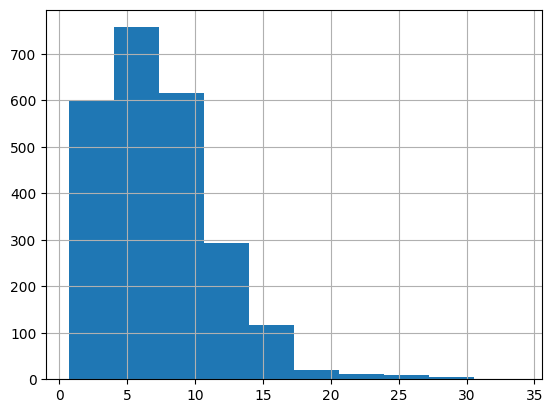

In [67]:
wao_df.adjusted_travel_times_v2.hist()

<Axes: >

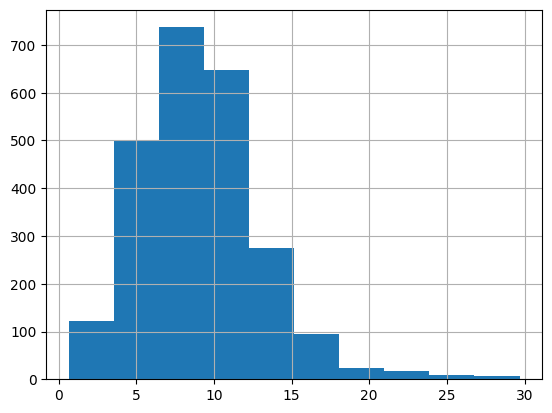

In [68]:
wao_df.adjusted_travel_times.hist()

<Axes: >

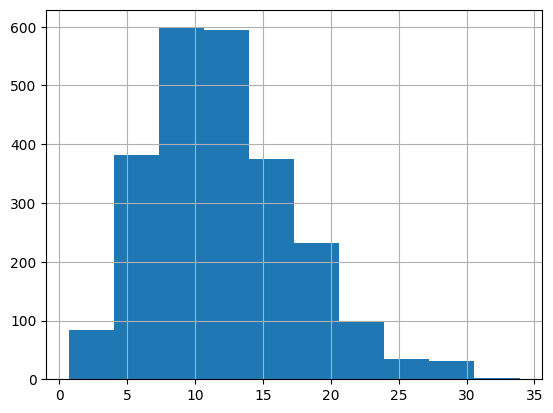

In [69]:
wao_df.min_cost.hist()

In [70]:
nearest_hospital_travel_bham_weighted_gdf = pd.merge(
    lsoa_boundaries,
    wao_df,
    left_on="LSOA11NM",
    right_on="LSOA",
    how="right"
)

In [71]:
def plot_birmingham_map(column_of_interest, title):
    xmin, xmax = 380000, 440000
    ymin, ymax = 250000, 310000

    # nearest_hospital_travel_bham_gdf_filter = nearest_hospital_travel_bham_gdf.cx[xmin:xmax, ymin:ymax]

    ax = nearest_hospital_travel_bham_weighted_gdf.plot(
        column=column_of_interest,
        cmap="Reds",
        legend=True,
        edgecolor="black",
        linewidth=0.5,
        alpha=0.6,
        figsize=(12,12)
        )

    ax.set_xlim(xmin-20000, xmax+20000)
    ax.set_ylim(ymin-20000, ymax+20000)

    hospital_points = birmingham_area_hospitals_gdf.plot(
        ax=ax,
        edgecolor='blue',
        color='white',
        markersize=40
        )

    cx.add_basemap(
        ax,
        crs=nearest_hospital_travel_bham_weighted_gdf.crs.to_string(),
        zoom=10
        )

    plt.title(title)
    ax.axis('off')


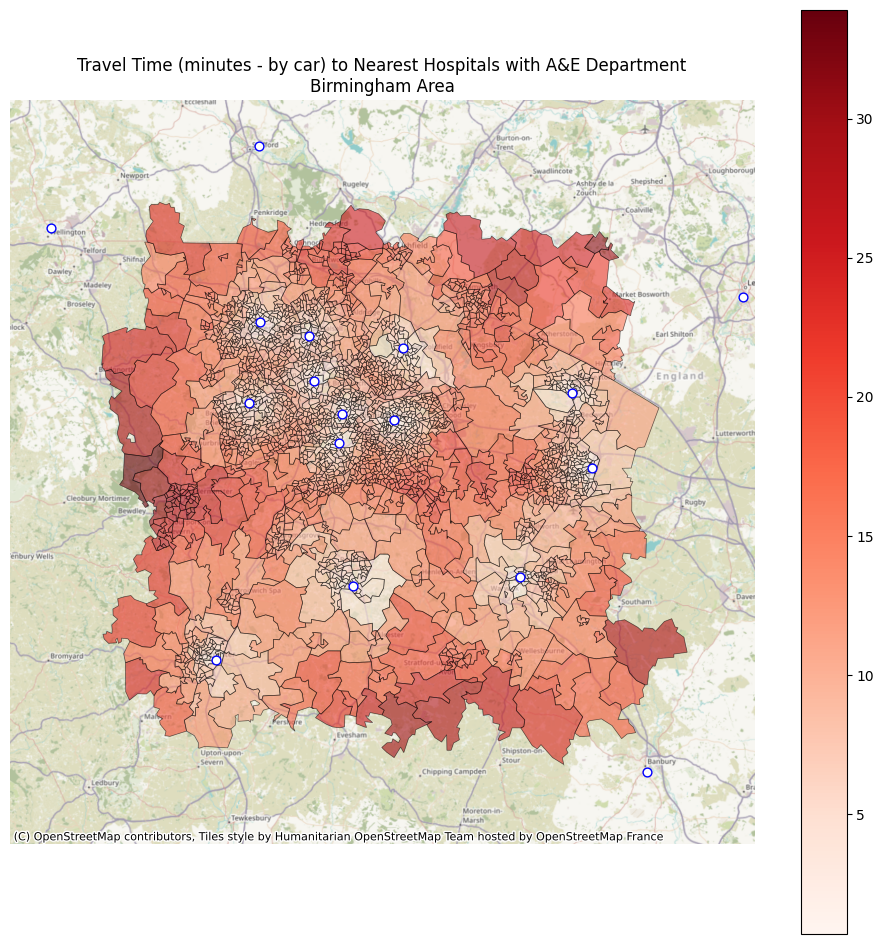

In [72]:
plot_birmingham_map(
    'min_cost',
    "Travel Time (minutes - by car) to Nearest Hospitals with A&E Department\nBirmingham Area"
    )

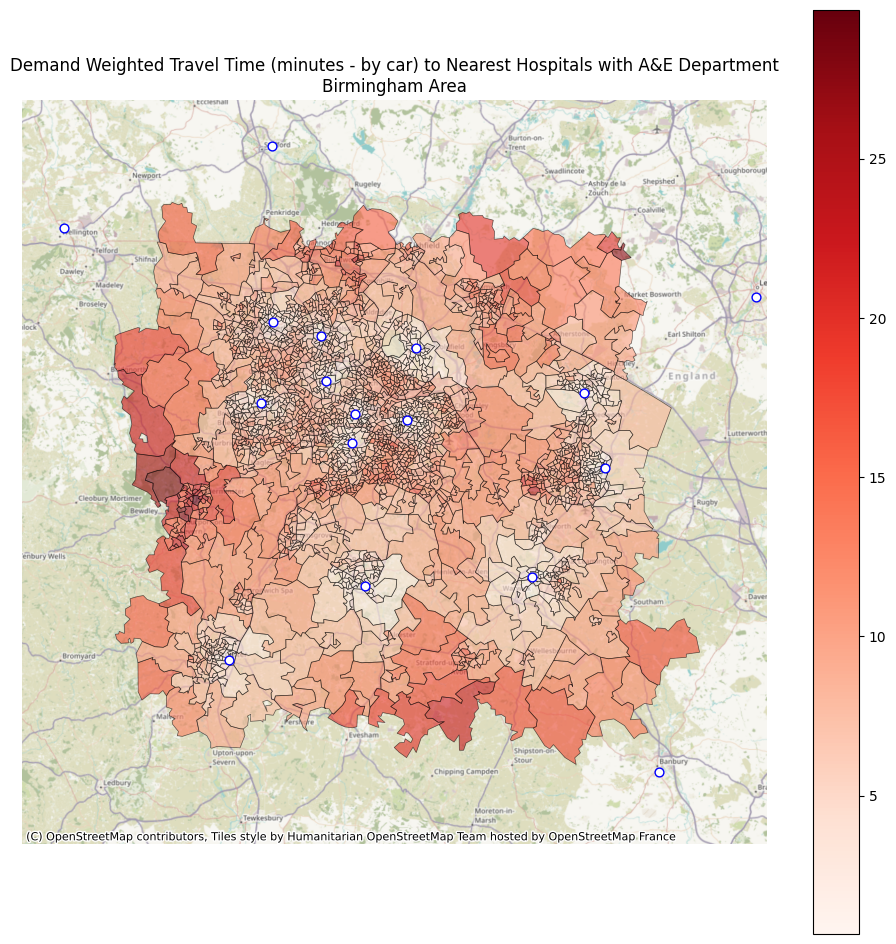

In [73]:
plot_birmingham_map(
    'adjusted_travel_times',
    "Demand Weighted Travel Time (minutes - by car) to Nearest Hospitals with A&E Department\nBirmingham Area"
    )

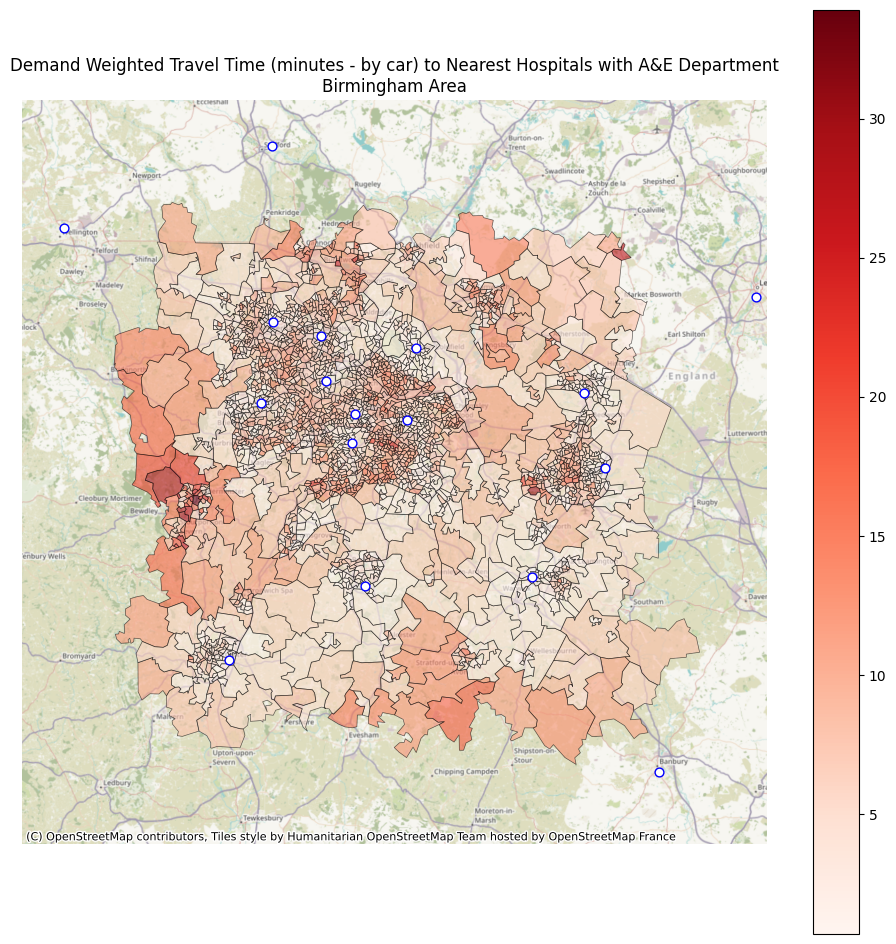

In [74]:
plot_birmingham_map(
    'adjusted_travel_times_v2',
    "Demand Weighted Travel Time (minutes - by car) to Nearest Hospitals with A&E Department\nBirmingham Area"
    )

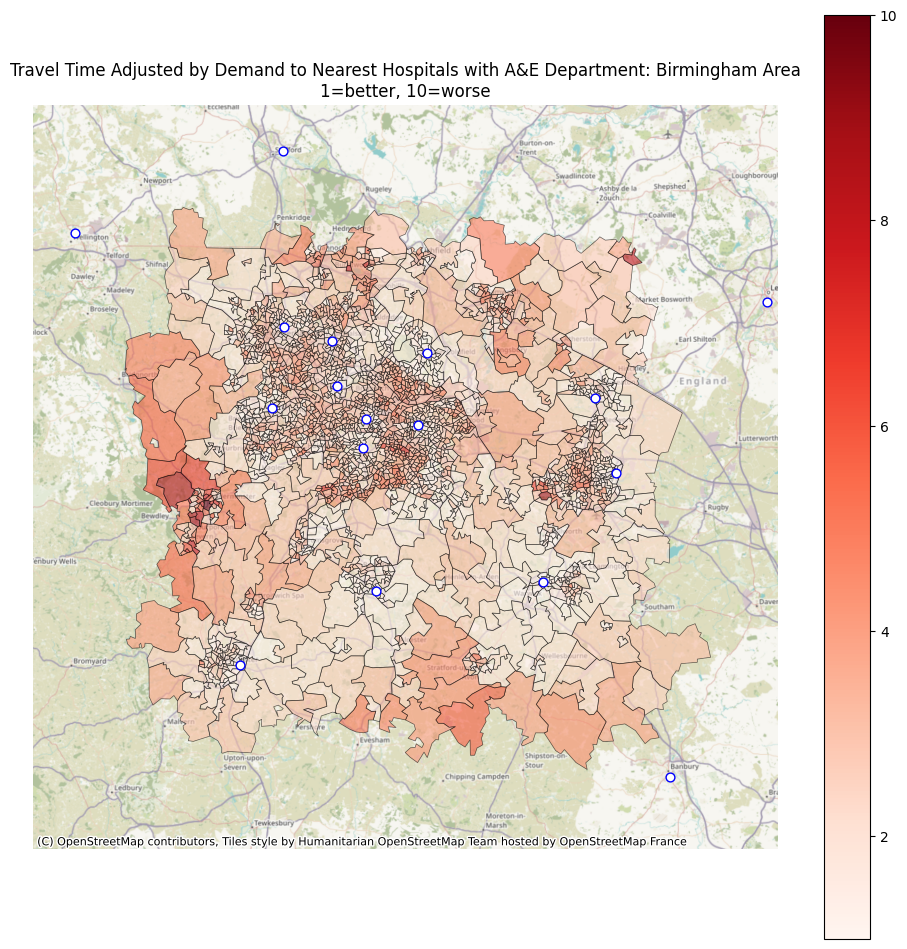

In [75]:
plot_birmingham_map(
    'adjusted_travel_times_v3',
    "Travel Time Adjusted by Demand to Nearest Hospitals with A&E Department: Birmingham Area\n1=better, 10=worse"
    )

In theory, here darker colours will indicate a strong combination of high travel time and high demand

Low travel times or low demand will influence a lower value.



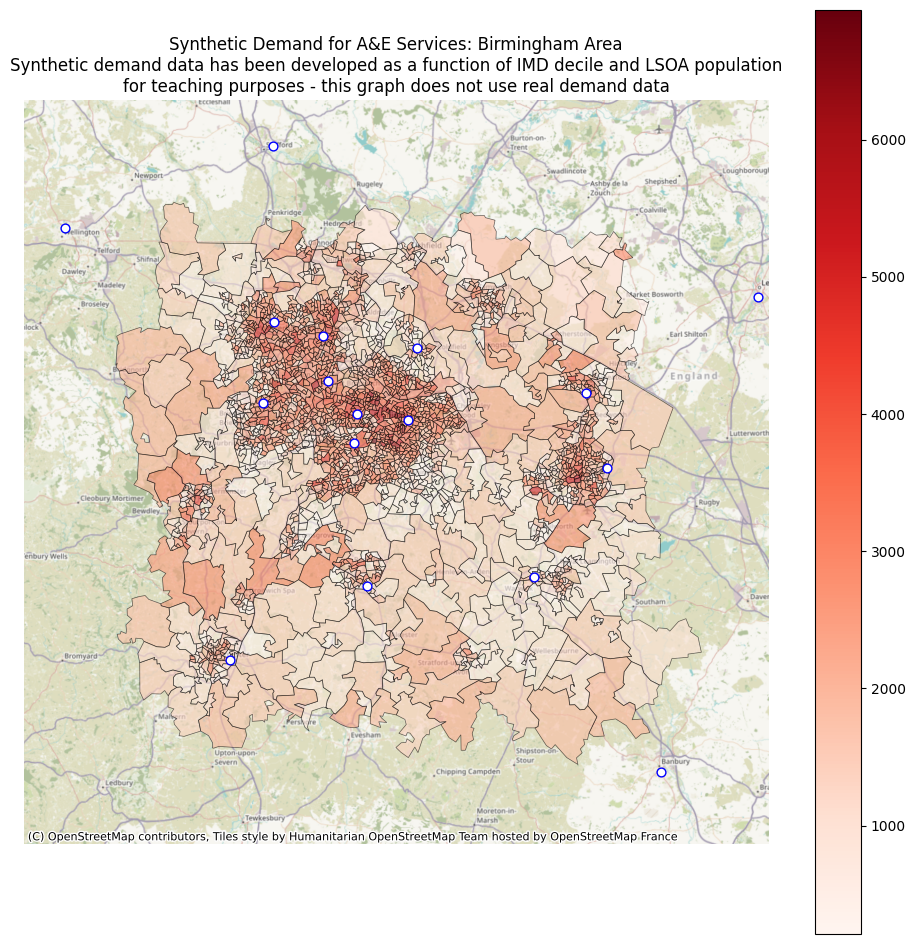

In [76]:
plot_birmingham_map(
    'demand',
    "Synthetic Demand for A&E Services: Birmingham Area\nSynthetic demand data has been developed as a function of IMD decile and LSOA population\nfor teaching purposes - this graph does not use real demand data"
    )

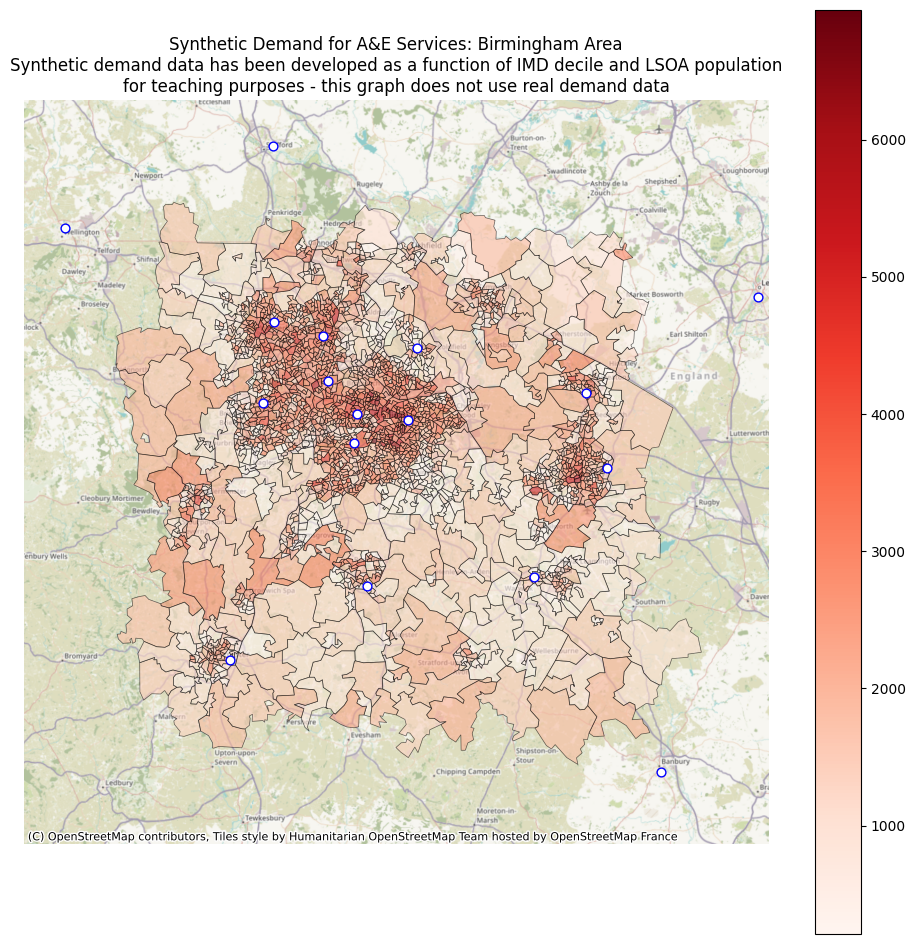

In [77]:
plot_birmingham_map(
    'demand',
    "Synthetic Demand for A&E Services: Birmingham Area\nSynthetic demand data has been developed as a function of IMD decile and LSOA population\nfor teaching purposes - this graph does not use real demand data"
    )

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=6c661ea7-9b58-4649-92ed-c2a834b4f69c' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>